Prerequisites are very simple you need to have GCP Console Acess as i'm uploading the files in the gcp bucket due to some constraints.

To access the GCP, we need to have the JSON key of business service account

## Importing the Dependencies

In [145]:
import numpy as np
import pandas as pd
import re
from matplotlib import pyplot as plt
import spacy
from spacy import displacy
import seaborn as sns
from selenium import webdriver
from bs4 import BeautifulSoup 
import selenium
from textblob import TextBlob
import bs4
import wget
from selenium import webdriver
from selenium.webdriver.chrome.options import Options
from webdriver_manager.chrome import ChromeDriverManager
import librosa
from google.cloud import speech_v1p1beta1 as speech
from google.protobuf.json_format import MessageToJson
import mir_eval
import IPython
from IPython.display import Audio
import matplotlib.pyplot as plt
import os
from google.cloud import storage
import sklearn
import nltk
import json

## Using Selenium to get all the urls (requests was giving the access denied issue)

In [67]:
options = Options()

options.add_argument("--window-size=1366,768")
options.add_argument("--disable-notifications")
options.add_argument('--no-sandbox')
options.add_argument("--lang=en")
options.add_argument("headless")

driver = webdriver.Chrome(options=options)
driver.maximize_window()
driver.get('https://callhounds.com/sample-call-center-recording/')
html=driver.page_source

Error getting version of chromedriver 115. Retrying with chromedriver 114 (attempt 1/5)


## Scraping all the audio file links

In [4]:
html_bs=BeautifulSoup(html)

links=[]
for a in html_bs.find_all('a',href=True):
    links.append(a['href'])
    
  
recordings=[]
for link in links:
    if link.find('uploads')>0:
        recordings.append(link)

        
unique_recordings=list(set(recordings))

## Downloading all the audio files and saving locally

In [746]:
for url in unique_recordings:
    wget.download(url, r"C:\Users\sagar\squadstack\recordings_second\{}".format(url.split('/')[-1]))

100% [............................................................................] 282620 / 282620

## Loading file (Mono Channel)

In [155]:
data1, sample_rate = librosa.load(r"C:\Users\sagar\squadstack\recordings\Local-Plumber.mp3")

In [156]:
print('y:', data1, '\n')
print('y shape:', np.shape(data1), '\n')
print('Sample Rate (KHz):', sample_rate, '\n')

total_duration = librosa.get_duration(y=data1, sr=sample_rate)
print('Check Len of Audio:',total_duration)

Audio(data=data1,rate=sample_rate)

y: [-3.6082248e-16  9.0205621e-17  2.2204460e-16 ...  0.0000000e+00
  0.0000000e+00  0.0000000e+00] 

y shape: (1809408,) 

Sample Rate (KHz): 22050 

Check Len of Audio: 82.05931972789115


## Loading file (Stereo Channel)

In [157]:
data2, sample_rate = librosa.load(r"C:\Users\sagar\squadstack\recordings\Local-Plumber.mp3",mono=False)


print('y:', data2, '\n')
print('y shape:', np.shape(data2), '\n')
print('Sample Rate (KHz):', sample_rate, '\n')

total_duration = librosa.get_duration(y=data2, sr=sample_rate)
print('Check Len of Audio:',total_duration)

Audio(data=data2,rate=sample_rate)

y: [[-3.6082248e-16  9.0205621e-17  2.2204460e-16 ...  0.0000000e+00
   0.0000000e+00  0.0000000e+00]
 [-3.6082248e-16  9.0205621e-17  2.2204460e-16 ...  0.0000000e+00
   0.0000000e+00  0.0000000e+00]] 

y shape: (2, 1809408) 

Sample Rate (KHz): 22050 

Check Len of Audio: 82.05931972789115


Y array:

Positive values in the y array represent compressions in the air, which correspond to regions of higher air pressure. These regions result in constructive interference and are associated with louder sound.
In other words, positive values in the audio signal indicate that the air pressure is above the equilibrium level (zero pressure), leading to the creation of sound waves.

Negative values in the y array represent rarefactions in the air, which correspond to regions of lower air pressure. These regions result in destructive interference and are associated with quieter sound.
In other words, negative values in the audio signal indicate that the air pressure is below the equilibrium level (zero pressure).

Sample Rate:
For librosa by default sample rate is 22050, it’s user define so we can give whatever is best for us



Detect Silent Regions:

Identify the silent regions in the audio signal. These are the regions where the amplitude (values in the y array) is close to zero or below a certain threshold. You can set a threshold based on the sensitivity you desire for detecting silence.

In [159]:
audio, _ = librosa.effects.trim(data1)

print('Audio File:', audio, '\n')
print('Audio File shape:', np.shape(audio))



Audio File: [-1.4227524e-05 -2.5217509e-05  1.4287556e-04 ... -3.1004503e-04
 -2.6973645e-04 -2.0618842e-04] 

Audio File shape: (1689600,)


## EDA

Will try to understand how the channel works with the same file

### Waveplot

Wave Plots are used to plot the natural waveform of an audio file for time, and ideally, it is sinusoidal. Here I have plotted the wave plot for both mono and stereotype of the same audio file.

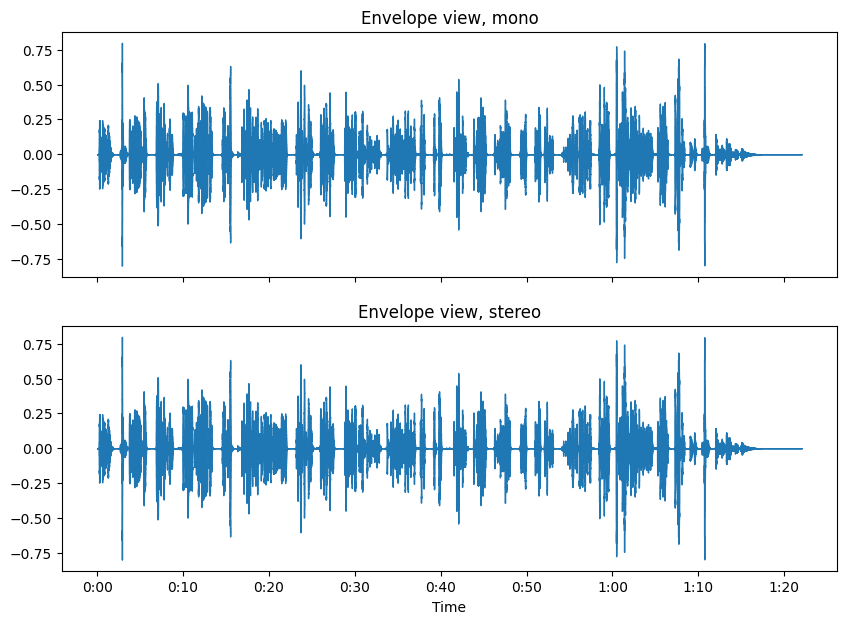

In [163]:
fig, ax = plt.subplots(nrows=2, sharex=True,figsize=(10,7))
librosa.display.waveshow(data1, sr=sample_rate, ax=ax[0])
ax[0].set(title='Envelope view, mono')
ax[0].label_outer()
librosa.display.waveshow(data2, sr=sample_rate, ax=ax[1])
ax[1].set(title='Envelope view, stereo')
ax[1].label_outer()

### Spectrogram


The spectrogram is a visual representation of a spectrum of different frequencies for time. Here we are plotting the spectrogram for linear frequencies and log frequencies. The use of these two types of spectrogram completely relies on matters of interest. If you are more interested in higher frequencies than lower ones, you should go with a linear frequencies plot

DB indicates the intensity level of the sound

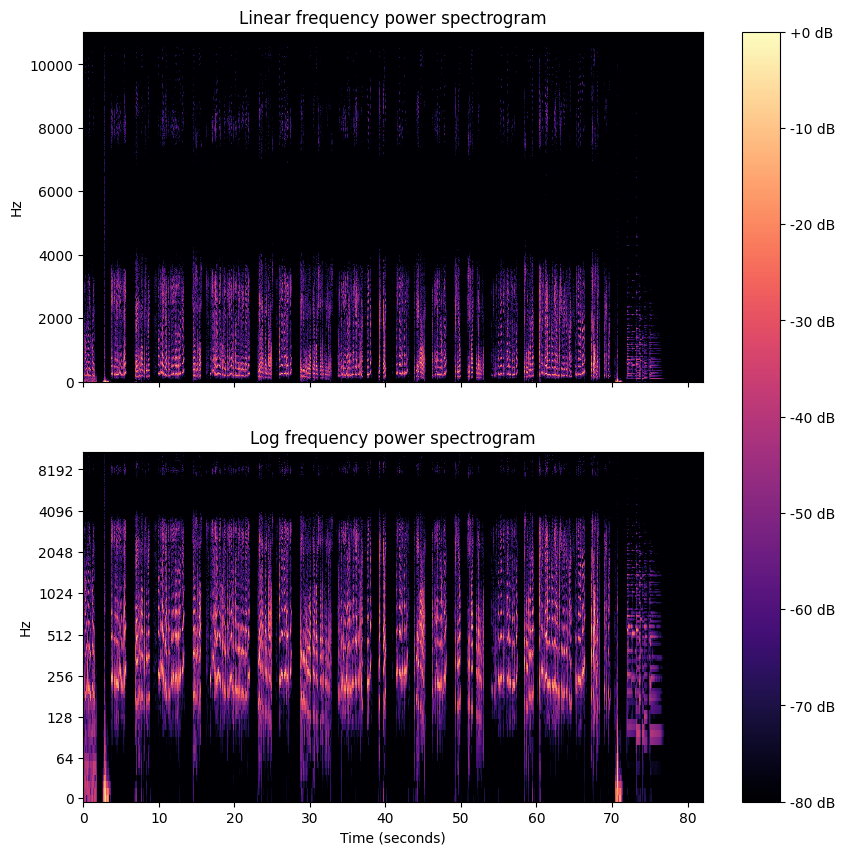

In [170]:
d = librosa.stft(data1)
#STFT is a technique that converts a signal from the time domain to the frequency domain
#and it represents how the frequency content of the signal changes over time. 
#The d will be a complex-valued matrix containing the STFT coefficients.
D = librosa.amplitude_to_db(np.abs(d),ref=np.max)
# This takes the absolute value of the STFT coefficients d, which gives us the magnitude spectrogram
# This function converts the magnitude spectrogram to decibels (dB). 
# The amplitude_to_db function scales the magnitude values to decibels 

fig,ax = plt.subplots(2,1,sharex=True,figsize=(10,10))
img = librosa.display.specshow(D, y_axis='linear', x_axis='s',sr=sample_rate,ax=ax[0])
ax[0].set(title='Linear frequency power spectrogram')
ax[0].label_outer()
librosa.display.specshow(D,y_axis='log',x_axis='s',sr=sample_rate,ax=ax[1])
ax[1].set(title='Log frequency power spectrogram')
ax[1].label_outer()
fig.colorbar(img, ax=ax, format='%+2.f dB')

From the above two spectrograms, we can easily say that the file contains the most information at middle frequencies, both graphs contain the same information. Therefore, to carry out further analysis, we should use a log frequency plot. 

## Chromagram

Chromagram closely relates to the twelve different pitch classes; these features are powerful tools for analysing music whose pitches can be meaningfully categorized often into twelve categories. One main property of chroma features is capturing harmonic and melodic characteristics of music while being an extensive change in the timbre and instrumentation. 

[Text(0.5, 1.0, 'Chromagram')]

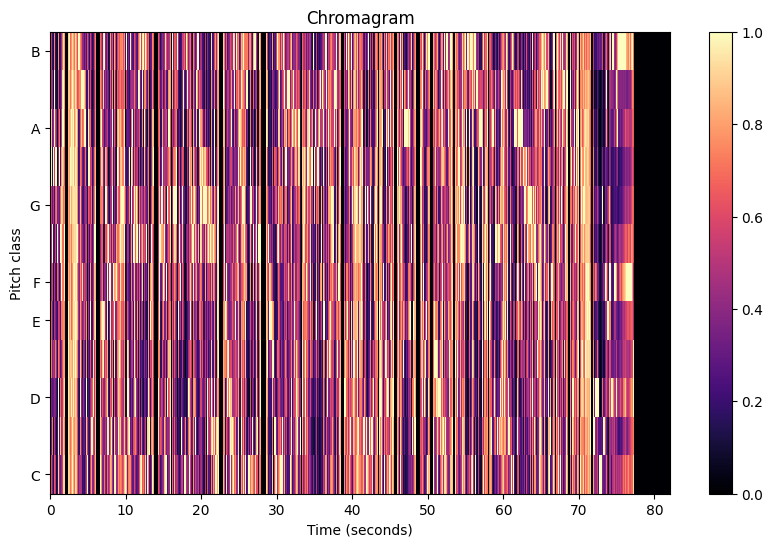

In [173]:
C = np.abs(librosa.stft(data1))
chroma = librosa.feature.chroma_stft(S=C, sr=sample_rate)
fig, ax = plt.subplots(figsize=(10,6))
img = librosa.display.specshow(chroma, y_axis='chroma', x_axis='s', ax=ax)
fig.colorbar(img, ax=ax)
ax.set(title='Chromagram')

### Tempogram

It is a time pulse representation of an audio signal laid out such that it indicates the variation of pulse strength over time, given a specific time lag or BPM value. The construction of a tempogram can be divided into two parts. First, the onset detection characterizes a series of musical events constituting the basic rhythmic content of the audio. This is followed by the estimation of local tempo using the autocorrelation or Fourier transform of the onset detection function computed over a short time window.  



C:\Users\sagar\AppData\Local\Temp\ipykernel_13868\356925807.py:7: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(onset_envelope=oenv, sr=sample_rate)[0]


[Text(0.5, 1.0, 'Tempogram')]

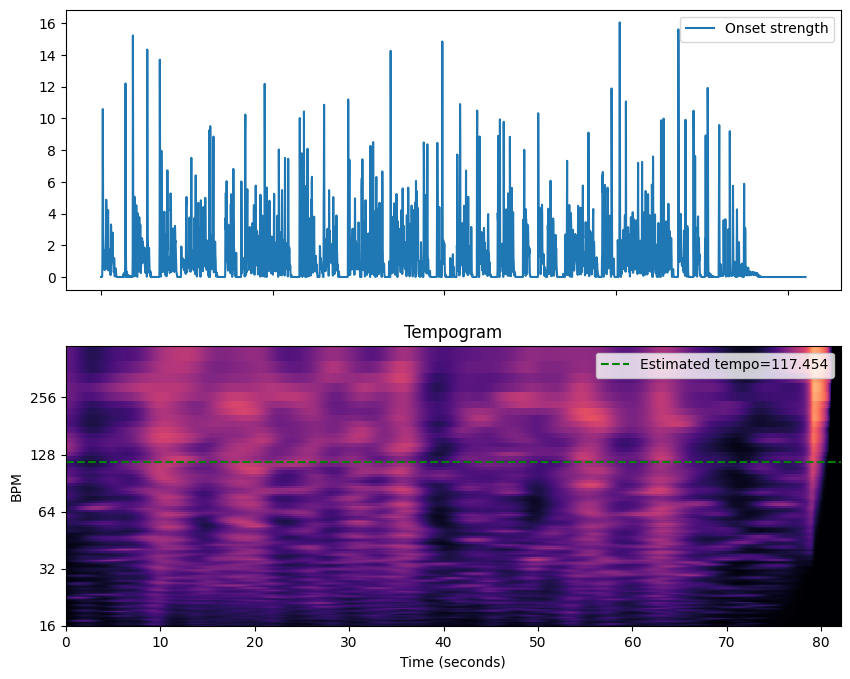

In [18]:
# It is commonly used to detect the timing of beats or musical events.
oenv = librosa.onset.onset_strength(y=data1, sr=sample_rate)

#The tempogram represents the rhythmic content of the audio signal over time 
tempogram = librosa.feature.tempogram(onset_envelope=oenv, sr=sample_rate)
# Compute global onset autocorrelation
ac_global = librosa.autocorrelate(oenv, max_size=tempogram.shape[0])
ac_global = librosa.util.normalize(ac_global)
# Estimate the global tempo for display purposes
tempo = librosa.beat.tempo(onset_envelope=oenv, sr=sample_rate)[0]
fig, ax = plt.subplots(nrows=2, figsize=(10, 8))
times = librosa.times_like(oenv, sr=sample_rate)
ax[0].plot(times, oenv, label='Onset strength')
ax[0].label_outer()
ax[0].legend(frameon=True)
librosa.display.specshow(tempogram, sr=sample_rate,x_axis='s', 
     y_axis='tempo', cmap='magma',ax=ax[1])
ax[1].axhline(tempo, color='g', linestyle='--', alpha=1,
            label='Estimated tempo={:g}'.format(tempo))
ax[1].legend(loc='upper right')
ax[1].set(title='Tempogram')

Tempo represents the approximate number of beats in the music occurring within one minute. A higher tempo value indicates a faster beat, while a lower tempo value indicates a slower beat.

In [177]:
#Fourier Transform
# here we are plotting the frequency bins changing over the time.

fft = 2048
hl = 512

stft = np.abs(librosa.stft(data1, n_fft = fft, hop_length = hl))

# n_fft: This parameter specifies the number of points to use for the Fast Fourier Transform (FFT) during each short-time window. 
# In this case, n_fft = 2048, which means that each short-time window will contain 2048 audio samples.

#hop_lenght: This parameter determines the number of audio samples between successive frames in the STFT. 
# It controls the time resolution of the STFT. In this case, hop_length = 512, which means that each frame will be shifted by 512 audio samples from the previous frame.
print(np.shape(stft))

(1025, 3535)


STFT indicating that there are 1025 frequency bins and 3535 time frames in the STFT representation.

 ...]

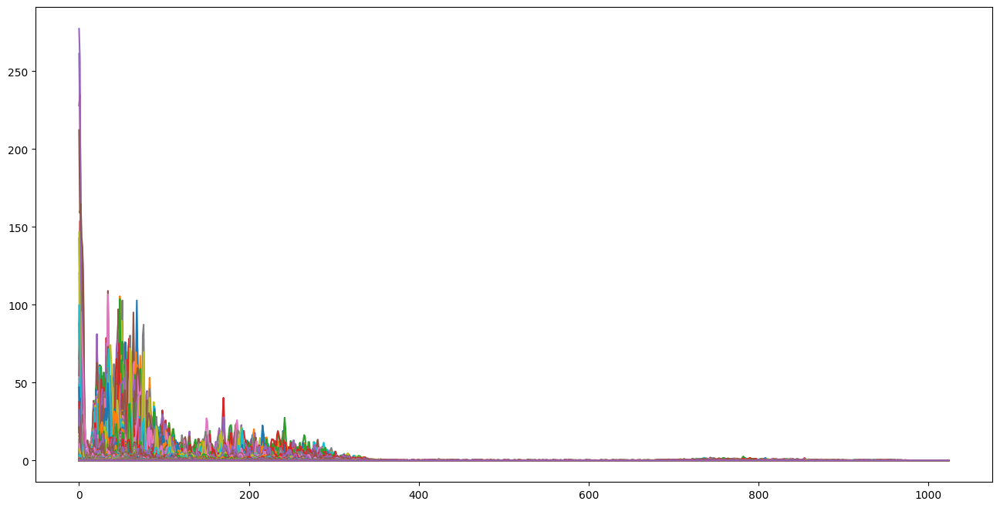

In [175]:
plt.figure(figsize = (16, 8))
plt.plot(stft)

we can separate the frequencies component like harmonic and percussive component from an audio file

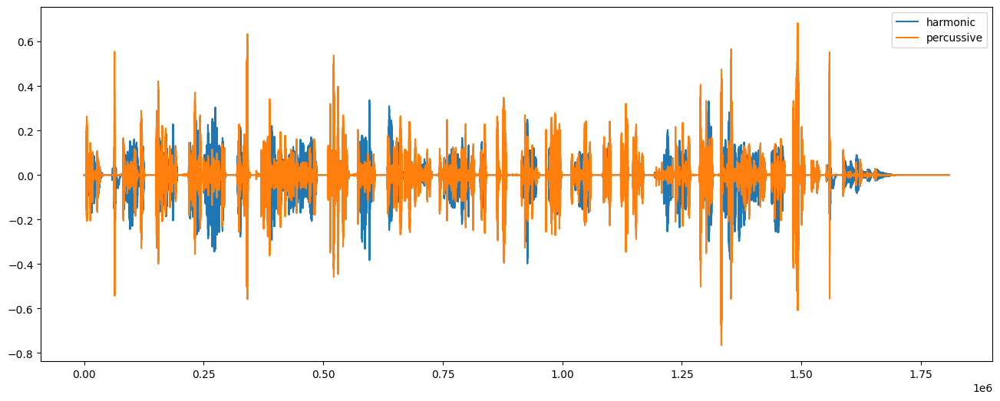

In [180]:
y_harm, y_perc = librosa.effects.hpss(data1)

plt.figure(figsize = (16, 6))
plt.plot(y_harm)
plt.plot(y_perc)
plt.legend(labels=['harmonic','percussive'])

## Spectral centroids and Spectral Roll Off

In [23]:
# mean weightage of the frequency per time frame
sc = librosa.feature.spectral_centroid(y=data1, sr=sample_rate)[0]

print('Centroids:', sc, '\n')
print('Shape of Spectral Centroids:', sc.shape, '\n')

frames = range(len(sc))

t = librosa.frames_to_time(frames)

print('frames:', frames, '\n')
print('t:', t)

def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

Centroids: [5505.82088379 5242.23484248 4471.86848909 ...    0.            0.
    0.        ] 

Shape of Spectral Centroids: (3535,) 

frames: range(0, 3535) 

t: [0.00000000e+00 2.32199546e-02 4.64399093e-02 ... 8.20128798e+01
 8.20360998e+01 8.20593197e+01]


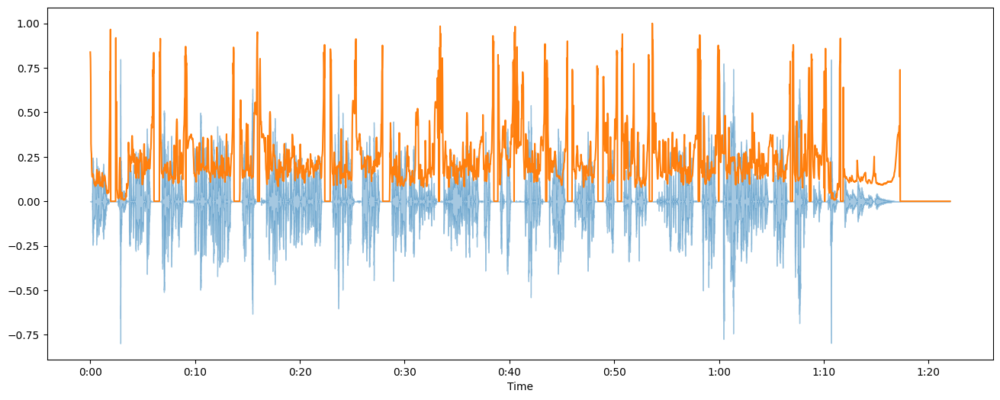

In [185]:
plt.figure(figsize = (16, 6))
librosa.display.waveshow(data1, sr=sample_rate, alpha=0.4)
#alpha indicates the transperancy
plt.plot(t, normalize(sc))

above plot display how the spectral centroid of the audio signal varies over time, which could be useful for tasks like identifying changes in pitch or spectral content throughout the audio.

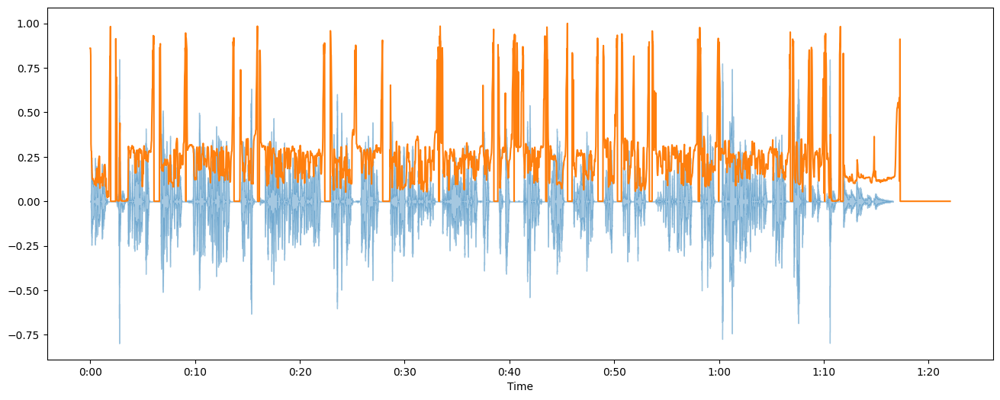

In [187]:
sr = librosa.feature.spectral_rolloff(y=data1, sr=sample_rate)[0]

# The plot
plt.figure(figsize = (16, 6))
librosa.display.waveshow(audio, sr=sample_rate, alpha=0.4)
plt.plot(t, normalize(sr))

### Mfcc allwos us to the the feature extraction and we can use for the ML part as well (Mel-frequency cepstral coefficients)

(20, 3535)


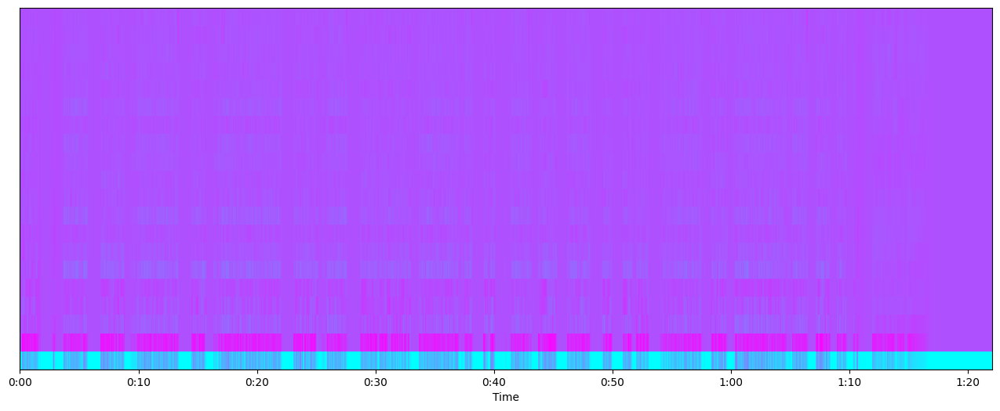

In [192]:
mfcc = librosa.feature.mfcc(y=data1, sr=sample_rate)
print(mfcc.shape)

plt.figure(figsize = (16, 6))
librosa.display.specshow(mfcc, sr=sample_rate, x_axis='time', cmap = 'cool')


The above plot shows how the MFCC coefficients vary over time, It can be useful for tasks such as speech recognition, speaker identification, and music genre classification, among others.

The purple color indicates higher magnitudes of MFCC coefficients. Darker purple correspond to higher values signifying stronger presence or energy of specific frequency components at those time frames.

The sky blue color indicates lower magnitudes of MFCC coefficients. Lighter sky blue regions correspond to lower values, suggesting weaker or less pronounced frequency components at those time frames.

C:\Users\sagar\miniconda3\Lib\site-packages\sklearn\preprocessing\_data.py:247: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn(
C:\Users\sagar\miniconda3\Lib\site-packages\sklearn\preprocessing\_data.py:266: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn(


Mean: 2.1582446e-10 

Var: 1.0


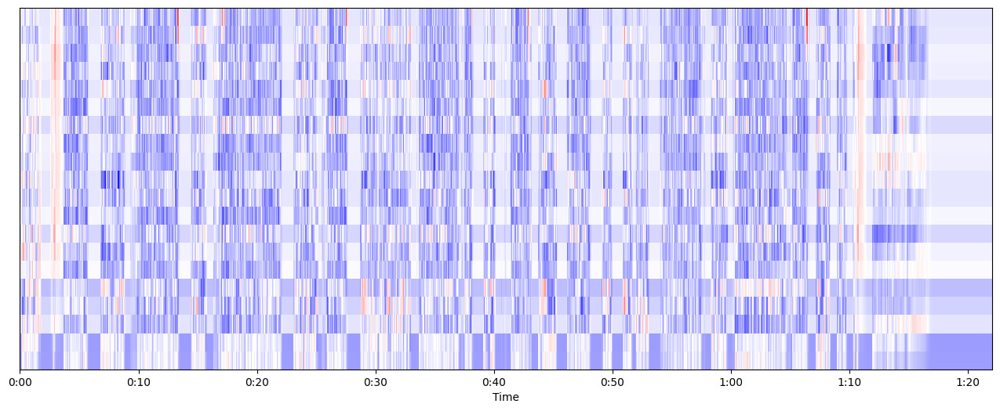

In [194]:
mfcc = sklearn.preprocessing.scale(mfcc, axis=1)
print('Mean:', mfcc.mean(), '\n')
print('Var:', mfcc.var())

plt.figure(figsize = (16, 6))
librosa.display.specshow(mfcc, sr=sample_rate, x_axis='time', cmap = 'bwr')

The colormap used for the plot is 'bwr', which stands for blue-white-red. Blue indicates negative values, white represents zero, and red indicates positive values. This colormap is useful for visualizing the relative magnitudes and directions of changes in the MFCC coefficients across time.

## Fetching all the details related to audio (including channels, total duration, silence % etc.)

In [197]:
def get_details_audio(audio_file_path):
    # Read the audio file using librosa
    audio_data, sample_rate = librosa.load(audio_file_path)

    # If the audio_data is 2-dimensional, it represents stereo (2 channels)
    if len(audio_data.shape) == 2:
        channels = "Stereo"
    else:
        channels = "Mono"  # Assume mono if not stereo
    
    
    # Set a threshold for silence detection (adjust as needed)
    silence_threshold = 0.01
    frame_duration=0.1

    # Convert the frame duration from seconds to samples
    frame_size = int(frame_duration * sample_rate)

    # Calculate the energy of each frame
    energy = [sum(abs(audio_data[i:i+frame_size])) for i in range(0, len(audio_data), frame_size)]

    # Count the number of silent frames (below the threshold)
    num_silent_frames = sum(1 for e in energy if e < silence_threshold)

    # Calculate the total number of frames
    total_frames = len(energy)

    # Calculate the silent percentage
    percentage_of_silence = (num_silent_frames / total_frames) * 100
    
    # total duration of the video in seconds
    total_duration = librosa.get_duration(y=audio_data, sr=sample_rate)
   
    return channels,total_duration,percentage_of_silence



In [198]:
get_details_audio(r"C:\Users\sagar\squadstack\recordings\Architecture-Firm.mp3")

('Mono', 63.994195011337865, 25.3125)

## Uploading all the files to GCP bucket as i"m going to use Google Cloud Speech Api for speech to text

In [200]:

def upload_files_to_gcs(local_directory, bucket_name):
    # Create a GCS client
    client = storage.Client()

    # Get the GCS bucket
    bucket = client.get_bucket(bucket_name)

    # List all files in the local directory
    for root, _, files in os.walk(local_directory):
        for filename in files:
            
            local_file_path = os.path.join(root, filename)

            # Specify the GCS blob name (the full path within the bucket)
            gcs_blob_name = os.path.relpath(local_file_path, local_directory)

            # Create or access the specific blob in the bucket
            blob = bucket.blob(gcs_blob_name)

            # Upload the local file to the GCS blob
            blob.upload_from_filename(local_file_path)

            print(f"Uploaded {local_file_path} to GCS bucket {bucket_name}, blob {gcs_blob_name}")

# Example usage:
local_directory_path = r"C:\Users\sagar\squadstack\recordings"
gcs_bucket_name = "speech-to-text23"

upload_files_to_gcs(local_directory_path, gcs_bucket_name)


Uploaded C:\Users\sagar\squadstack\recordings\Architecture-Firm.mp3 to GCS bucket speech-to-text23, blob Architecture-Firm.mp3
Uploaded C:\Users\sagar\squadstack\recordings\Costco.mp3 to GCS bucket speech-to-text23, blob Costco.mp3
Uploaded C:\Users\sagar\squadstack\recordings\Custom-Home-Builder.mp3 to GCS bucket speech-to-text23, blob Custom-Home-Builder.mp3
Uploaded C:\Users\sagar\squadstack\recordings\Fundraising.mp3 to GCS bucket speech-to-text23, blob Fundraising.mp3
Uploaded C:\Users\sagar\squadstack\recordings\Health-Insurance-1.mp3 to GCS bucket speech-to-text23, blob Health-Insurance-1.mp3
Uploaded C:\Users\sagar\squadstack\recordings\Health-Insurance-2.mp3 to GCS bucket speech-to-text23, blob Health-Insurance-2.mp3
Uploaded C:\Users\sagar\squadstack\recordings\HP-Technician-Dispat-1.wav to GCS bucket speech-to-text23, blob HP-Technician-Dispat-1.wav
Uploaded C:\Users\sagar\squadstack\recordings\HP-Technician-Dispatch-2.wav to GCS bucket speech-to-text23, blob HP-Technician-D

## Fetching the URI's from the gcp bucket as we need to run the same api

In [206]:
os.environ["GOOGLE_APPLICATION_CREDENTIALS"] = r"C:\Users\sagar\squadstack\service_account_key.json"

def list_uris_in_gcs_bucket(bucket_name):
    # Create a GCS client
    client = storage.Client()

    # Get the GCS bucket
    bucket = client.get_bucket(bucket_name)

    # List all blobs in the bucket
    blobs = bucket.list_blobs()

    # Filter and get the URIs of MP3 files
    mp3_uris = [blob.public_url for blob in blobs if blob.name.lower()]

    return mp3_uris

# Example usage:
gcs_bucket_name = "speech-to-text23"
mp3_uris = list_uris_in_gcs_bucket(gcs_bucket_name)


In [207]:
uris_and_urls=[]

for uris in mp3_uris:
    for url in unique_recordings:
        if uris.split('/')[-1].split(".")[0]== url.split('/')[-1].split(".")[0]:
            query={'URIS':uris,'URL':url}
            uris_and_urls.append(query)
       


df_uris_urls=pd.DataFrame(uris_and_urls)
          
            
            
            
        

In [208]:
df_uris_urls['URIS'].values

array(['https://storage.googleapis.com/speech-to-text23/Architecture-Firm.mp3',
       'https://storage.googleapis.com/speech-to-text23/Costco.mp3',
       'https://storage.googleapis.com/speech-to-text23/Custom-Home-Builder.mp3',
       'https://storage.googleapis.com/speech-to-text23/Fundraising.mp3',
       'https://storage.googleapis.com/speech-to-text23/HP-Technician-Dispat-1.wav',
       'https://storage.googleapis.com/speech-to-text23/HP-Technician-Dispatch-2.wav',
       'https://storage.googleapis.com/speech-to-text23/Health-Insurance-1.mp3',
       'https://storage.googleapis.com/speech-to-text23/Health-Insurance-2.mp3',
       'https://storage.googleapis.com/speech-to-text23/Local-Plumber.mp3',
       'https://storage.googleapis.com/speech-to-text23/Logistics.mp3',
       'https://storage.googleapis.com/speech-to-text23/Property-Management-Office.mp3',
       'https://storage.googleapis.com/speech-to-text23/Real-State-Lead-Gen-1.mp3',
       'https://storage.googleapis.com/s

## Writing a function for speech to text conversion

In [209]:
def speech_to_text(uri):
    
    client = speech.SpeechClient()


#     with open(r"%s"%audio_file_path, "rb") as audio_file:
#         content = audio_file.read()

# giving the condition as both wav and mp3 files need different configuration

    if uri.split('/')[-1].split('.')[-1]=='mp3':

        audio = speech.RecognitionAudio(uri=uri)

        diarization_config = speech.SpeakerDiarizationConfig(
            enable_speaker_diarization=True,
            min_speaker_count=2,
            max_speaker_count=10,
        )

        config = speech.RecognitionConfig(
            enable_automatic_punctuation=True,
            sample_rate_hertz=48000,
            language_code="en-US",
            diarization_config=diarization_config,
            audio_channel_count=1
        )
        
    else:
        audio = speech.RecognitionAudio(uri=uri)

        diarization_config = speech.SpeakerDiarizationConfig(
            enable_speaker_diarization=True,
            min_speaker_count=2,
            max_speaker_count=10,
        )

        config = speech.RecognitionConfig(
            enable_automatic_punctuation=True,
            language_code="en-US",
            diarization_config=diarization_config,
            audio_channel_count=1
        )
        

    print("Waiting for operation to complete...")
    operation =client.long_running_recognize(config=config, audio=audio)
    
    response = operation.result(timeout=600)  # Adjust the timeout value as needed

    # Serialize the response to a dictionary
    response_json = MessageToJson(response._pb)

    json_output = json.loads(response_json)

    return json_output

## Capturing all the details from the Google Speech API Response

In [210]:
def Transcripts_with_tagged_speakers(json_output):
    
    start_time=[]
    end_time=[]
    word=[]
    speaker=[]

    for i in range(len(json_output['results'][-1]['alternatives'][0]['words'])):
        start_time.append(json_output['results'][-1]['alternatives'][0]['words'][i]['startTime'])
        end_time.append(json_output['results'][-1]['alternatives'][0]['words'][i]['endTime'])
        word.append(json_output['results'][-1]['alternatives'][0]['words'][i]['word'])
        speaker.append(json_output['results'][-1]['alternatives'][0]['words'][i]['speakerTag'])
        
    df=pd.DataFrame()
    df['start_time']=start_time
    df['end_time']=end_time
    df['word']=word
    df['speaker']=speaker
    
    df['start_time']=df['start_time'].apply(lambda x: float(re.sub('s','',x)))
    
    df['end_time']=df['end_time'].apply(lambda x: float(re.sub('s','',x)))
    
    
    df = df.sort_values(['start_time', 'end_time'])
    
    df['current_speaker'] = (df.speaker.shift() != df.speaker).cumsum()
    
    
    transcripts = df.groupby('current_speaker').agg({
    'end_time':lambda x: max(x) - min(x),
   'word': lambda x: ' '.join(x),
   'speaker': min}).rename(columns={'end_time':'transcript_processing_time','word': 'Summary'})
    
    transcripts.reset_index(drop=True,inplace=True)
    
    return transcripts

## Running the Textblob for capturing emotions for our transcripts

In [211]:
def get_emotion(text):
    # Create a TextBlob object for the input text
    blob = TextBlob(text)

    # Get the sentiment polarity and subjectivity
    sentiment_polarity = blob.sentiment.polarity
    sentiment_subjectivity = blob.sentiment.subjectivity

    # Determine the emotion based on the sentiment polarity and subjectivity
    if sentiment_polarity > 0:
        emotion = "positive"
    elif sentiment_polarity < 0:
        emotion = "negative"
    else:
        emotion = "neutral"

    # Return the emotion and sentiment information
    return emotion, sentiment_polarity, sentiment_subjectivity

# # Example usage:
# text = transcripts['transcript'][1]
# emotion, polarity, subjectivity = get_emotion(text)
# print(f"Emotion: {emotion}")
# print(f"Polarity: {polarity}")
# print(f"Subjectivity: {subjectivity}")


## Initiating simple NER for Tagging

In [212]:

NER = spacy.load("en_core_web_sm")

def ner(text):
    output=NER(text)
    new_output={}
    for word in output.ents:
        new_output[word.text]=word.label_
    
    if new_output:
        return new_output
    else:
        return None
        
    

In [213]:
df_uris_urls

,URIS,URL
0,https://storage.googleapis.com/speech-to-text2...,https://callhounds.com/wp-content/uploads/2020...
1,https://storage.googleapis.com/speech-to-text2...,https://callhounds.com/wp-content/uploads/2020...
2,https://storage.googleapis.com/speech-to-text2...,https://callhounds.com/wp-content/uploads/2020...
3,https://storage.googleapis.com/speech-to-text2...,https://callhounds.com/wp-content/uploads/2020...
4,https://storage.googleapis.com/speech-to-text2...,https://callhounds.com/wp-content/uploads/2022...
5,https://storage.googleapis.com/speech-to-text2...,https://callhounds.com/wp-content/uploads/2022...
6,https://storage.googleapis.com/speech-to-text2...,https://callhounds.com/wp-content/uploads/2020...
7,https://storage.googleapis.com/speech-to-text2...,https://callhounds.com/wp-content/uploads/2020...
8,https://storage.googleapis.com/speech-to-text2...,https://callhounds.com/wp-content/uploads/2020...
9,https://storage.googleapis.com/speech-to-text2...,https://callhounds.com/wp-content/uploads/2020...


## Executing all the functions that we have created above and getting the final data

In [214]:
final_data=pd.DataFrame()
file_num=1
for uris,url in zip(df_uris_urls['URIS'],df_uris_urls['URL']):
    
    
    uri="gs://{}/{}".format(uris.split("/")[-2],uris.split("/")[-1])
    
    print("Bucket URI",uri)
    
    #folder path from where we should read the audios
    audio_file_path=r"C:\Users\sagar\squadstack\recordings\{}".format(url.split('/')[-1])
    
    print("Audio File",audio_file_path)
    print('Exercise has been started for the {} file'.format(file_num))
    
    print('started reading the files')
    channels,total_duration,percentage_of_silence=get_details_audio(audio_file_path)
    print('completed-----------capturing the important details ')
    
    try:
        print('Started the speech to text using google cloud search api')
        json_output=speech_to_text(uri)
#         print(json_output)
        print('Done')

        print('Speaker stagging with the transcripts started')
        transcripts=Transcripts_with_tagged_speakers(json_output)
#         print(transcripts)
        print('Done')


        print('Started the emotions mapping using textblob')

        emotions_df=transcripts['Summary'].apply(lambda x: pd.Series({'Emotion':get_emotion(x)[0], 'Polarity':get_emotion(x)[1],
                                                              'Subjectivity':get_emotion(x)[2]}))
#         print(emotions_df.head())

        transcripts_emotions=pd.concat([transcripts,emotions_df],axis=1)

#         print(transcripts_emotions.head())

        print('Done')
        print('Started NER Tagging using Scipy')
        transcripts_emotions['NER']=transcripts_emotions['Summary'].apply(ner)
#         print(transcripts_emotions.head())
        print('Done')

        transcripts_emotions['Audio_URL']=url

        transcripts_emotions['Channels']=channels

        transcripts_emotions['Silence %']=percentage_of_silence

        transcripts_emotions['Duration of audio']=total_duration
        
        transcripts_emotions['Talk Ratio %']=transcripts_emotions['transcript_processing_time']/transcripts_emotions['Duration of audio']*100

#         print(transcripts_emotions.head())

        final_data=pd.concat([final_data,transcripts_emotions],ignore_index=False)
    #     print(final_data)

        file_num+=1
        
    except:
        pass

        
print('Completed')


Bucket URI gs://speech-to-text23/Architecture-Firm.mp3
Audio File C:\Users\sagar\squadstack\recordings\Architecture-Firm.mp3
Exercise has been started for the 1 file
started reading the files
completed-----------capturing the important details 
Started the speech to text using google cloud search api
Waiting for operation to complete...
Done
Speaker stagging with the transcripts started
Done
Started the emotions mapping using textblob
Done
Started NER Tagging using Scipy
Done
Bucket URI gs://speech-to-text23/Costco.mp3
Audio File C:\Users\sagar\squadstack\recordings\Costco.mp3
Exercise has been started for the 2 file
started reading the files
completed-----------capturing the important details 
Started the speech to text using google cloud search api
Waiting for operation to complete...
Bucket URI gs://speech-to-text23/Custom-Home-Builder.mp3
Audio File C:\Users\sagar\squadstack\recordings\Custom-Home-Builder.mp3
Exercise has been started for the 2 file
started reading the files
comple

In [215]:
final_data.reset_index(drop=True,inplace=True)

## Saving the csv file

In [216]:
final_data[['Summary','Talk Ratio %', 'Emotion', 'NER', 'Audio_URL',
       'Channels', 'Silence %', 'Duration of audio']].to_csv('Squadstack_output.csv',index=False)

## Metric Evaluations

In [1039]:
# Alternative way getting tag speaker but not a good way if we don't have proper context of the audio
# Function to transcribe audio using Google Cloud Speech-to-Text API
# for metric evaluation i'm taking the longest video and i'll type manually to get the difference and will get the idea

final_data[~final_data['NER'].isnull()]['NER'].values



array([{'afternoon': 'TIME'}, {'John': 'PERSON'}, {'John': 'PERSON'},
       {'Lowery': 'GPE'},
       {'610': 'CARDINAL', '265 17': 'CARDINAL', '14': 'DATE'},
       {'Elkins': 'PERSON'}, {'first': 'ORDINAL'}, {'n. Qma': 'PERSON'},
       {'6': 'CARDINAL'}, {'Westchester': 'ORG'},
       {'this afternoon': 'TIME', 'Elkins': 'PERSON'},
       {'Mike Anderson': 'PERSON', 'HP': 'ORG', 'Tina': 'PERSON', 'today': 'DATE', '5 p.m.': 'TIME'},
       {'today': 'DATE'},
       {'1132': 'DATE', 'Ash Berry Drive': 'PERSON', 'Decatur': 'GPE', 'Georgia': 'GPE', '30030': 'DATE'},
       {'Dan': 'PERSON', 'Number 985-260-5400': 'CARDINAL', '848': 'CARDINAL'},
       {'Dan': 'PERSON', 'Number 985-260-5400': 'CARDINAL', '848': 'CARDINAL'},
       {'Amos': 'PERSON'},
       {'Cody': 'PERSON', 'Amy': 'PERSON', 'HP': 'GPE', 'W': 'PERSON', '0 0': 'DATE', '166': 'CARDINAL', 'today': 'DATE', 'tomorrow': 'DATE'},
       {'first': 'ORDINAL'}, {'tomorrow': 'DATE', '10 a.m.': 'TIME'},
       {'12': 'CARDINAL', '

In [1024]:
final_data[final_data['Emotion']=='positive']['Summary'].values

array(['This call is now being recorded. Good afternoon. Mtk design. I hope you have plans drawn up for an addition to my house. Return your call. May I have your name, please.',
       "Okay, I'm your telephone number", "I'm at Thank you very much.",
       'Call is now being recorded. good afternoon, Elkins builders',
       'a great. Let me get your name but your first name, please. And your laughing.',
       'Okay, no problem. Is it a good time to reach you at this number? Or is that an anytime?',
       "Okay, no problem. I'll pass your message along and somebody should be getting back to you this afternoon. You're welcome and thank you for calling Elkins builders",
       "Hello, can you hear me? Good? Yes. Hello. Ohh hi good day. This is Mike Anderson from HP calling regarding a service event here and we are in the process of coordinating the repair for you. And if so, alright Tina's already began working to schedule this work order until today at 5 p.m. Are you aware of this j

### Creating the dataframe with model predicted values and Real values to evaluate the model for Text Summarization

In [222]:
# will create one dataframe for both the machine generated text and human written text for further evaluation

data=[{'speech to text':'Hi, they are calling Hotel. California. This is Candice. How may I help you?',
      "Human text":"Hi, thank you for calling hotel california, This is Candince, How may i help you?"},
     
     {'speech to text':"Hi, Candice. This is Steven. I'd like to book for four people, please. And that would be for August",
      "Human text":"Hi, Candice. This is Steven. I'd like to book for four people please, And that would be for August 18th"},
      
      {'speech to text':"18th. Sure. Steven, I'd be happy to help you with that. So, which room do you have in mind?",
      "Human text":"Sure. Steven, I'd be happy to help you with that. So, which room do you have in mind?"},
      
      {'speech to text':"So I haven't been able to browse through your website and I don't know, I don't really know the rooms you have right now but I could give you my requirements and then you suggest the best rooms for me. Could we do that?",
      "Human text":"So actually i got tell you first that i am super busy so I haven't been able to browse through your website and I don't know, I don't really know the rooms you have right now but I could give you my requirements and then you suggest the best rooms for me. Could we do that?"},
     
     ]

In [223]:
df_evaluation=pd.DataFrame(data)

In [224]:
df_evaluation

,speech to text,Human text
0,"Hi, they are calling Hotel. California. This i...","Hi, thank you for calling hotel california, Th..."
1,"Hi, Candice. This is Steven. I'd like to book ...","Hi, Candice. This is Steven. I'd like to book ..."
2,"18th. Sure. Steven, I'd be happy to help you w...","Sure. Steven, I'd be happy to help you with th..."
3,So I haven't been able to browse through your ...,So actually i got tell you first that i am sup...


## ROUGE (Recall-Oriented Understudy for Gisting Evaluation) for Text Summarization

ROUGE (Recall-Oriented Understudy for Gisting Evaluation) is a set of evaluation metrics commonly used in the field of Natural Language Processing (NLP) and specifically in the area of text summarization. The ROUGE metrics are designed to assess the quality of automatic summaries by comparing them to reference (human-generated) summaries.

The main idea behind ROUGE is to measure the overlap between the words or n-grams (contiguous sequences of words) in the system-generated summary and the words or n-grams in the reference summary. The metrics evaluate both the precision and recall of the generated summary with respect to the reference summary.

There are several ROUGE metrics, each focusing on different aspects of the summarization evaluation:

ROUGE-N: Measures the overlap of n-grams (unigrams, bigrams, trigrams, etc.) between the system summary and the reference summary.

ROUGE-L: Calculates the longest common subsequence between the system and reference summaries. It considers the longest sequence of words that appears in both summaries.

ROUGE-W: A weighted version of ROUGE that gives more importance to longer n-grams.

ROUGE-S: Considers skip-bigrams (n-grams with one or more words skipped) and their overlap.

ROUGE-SU: Combines skip-bigrams and unigrams for evaluation.

In [235]:
from nltk.translate.bleu_score import sentence_bleu
from nltk.util import ngrams
import nltk

def compute_rouge_n(hypothesis, reference, n):
    hypothesis_ngrams = set(ngrams(hypothesis, n))
    reference_ngrams = set(ngrams(reference, n))
    intersection_ngrams = hypothesis_ngrams.intersection(reference_ngrams)
    precision = len(intersection_ngrams) / len(hypothesis_ngrams)
    recall = len(intersection_ngrams) / len(reference_ngrams)
    if precision + recall > 0:
        f1_score = (2 * precision * recall) / (precision + recall)
    else:
        f1_score = 0
    return precision, recall, f1_score

def compute_rouge_l(hypothesis, reference):
    hypothesis_ngrams = set(ngrams(hypothesis, 1))
    reference_ngrams = set(ngrams(reference, 1))
    intersection_ngrams = hypothesis_ngrams.intersection(reference_ngrams)
    precision = len(intersection_ngrams) / len(hypothesis_ngrams)
    recall = len(intersection_ngrams) / len(reference_ngrams)
    if precision + recall > 0:
        f1_score = (2 * precision * recall) / (precision + recall)
    else:
        f1_score = 0
    return precision, recall, f1_score



def compute_weighted_rouge_n(hypothesis, reference, n):
    hypothesis_ngrams = set(ngrams(hypothesis, n))
    reference_ngrams = set(ngrams(reference, n))

    hypothesis_weights = {ngram: 1.0 / (1.0 + abs(len(ngram) - n)) for ngram in hypothesis_ngrams}
    reference_weights = {ngram: 1.0 / (1.0 + abs(len(ngram) - n)) for ngram in reference_ngrams}

    weighted_overlap = sum(hypothesis_weights[ngram] for ngram in hypothesis_ngrams.intersection(reference_ngrams))
    total_hypothesis_weight = sum(hypothesis_weights.values())
    total_reference_weight = sum(reference_weights.values())

    precision = weighted_overlap / total_hypothesis_weight
    recall = weighted_overlap / total_reference_weight

    if precision + recall > 0:
        f1_score = (2 * precision * recall) / (precision + recall)
    else:
        f1_score = 0

    return precision, recall, f1_score

def generate_skip_bigrams(tokens, n):
    skip_bigrams = []
    for i in range(len(tokens) - n + 1):
        skip_bigram = tuple(tokens[i:i+n])
        skip_bigrams.append(skip_bigram)
        for skip_pos in range(1, n):
            skip_bigram = tuple(tokens[i:i+skip_pos] + [''] + tokens[i+skip_pos+n-1:i+n])
            skip_bigrams.append(skip_bigram)
    return skip_bigrams

def compute_weighted_rouge_s(hypothesis, reference, n):
    hypothesis_ngrams = set(ngrams(hypothesis, n))
    reference_ngrams = set(ngrams(reference, n))

    hypothesis_skip_bigrams = set(generate_skip_bigrams(hypothesis, n))
    reference_skip_bigrams = set(generate_skip_bigrams(reference, n))

    intersection_ngrams = hypothesis_ngrams.intersection(reference_ngrams)
    intersection_skip_bigrams = hypothesis_skip_bigrams.intersection(reference_skip_bigrams)

    total_intersection = len(intersection_ngrams) + len(intersection_skip_bigrams)
    total_hypothesis = len(hypothesis_ngrams) + len(hypothesis_skip_bigrams)
    total_reference = len(reference_ngrams) + len(reference_skip_bigrams)

    precision = total_intersection / total_hypothesis
    recall = total_intersection / total_reference

    if precision + recall > 0:
        f1_score = (2 * precision * recall) / (precision + recall)
    else:
        f1_score = 0

    return precision, recall, f1_score

def compute_rouge_su(hypothesis, reference):
    rouge_1_precision, rouge_1_recall, rouge_1_f1 = compute_rouge_n(hypothesis, reference, 1)
    rouge_s_precision, rouge_s_recall, rouge_s_f1 = compute_weighted_rouge_s(hypothesis, reference, 2)

    combined_precision = (rouge_1_precision + rouge_s_precision) / 2
    combined_recall = (rouge_1_recall + rouge_s_recall) / 2

    if combined_precision + combined_recall > 0:
        combined_f1 = (2 * combined_precision * combined_recall) / (combined_precision + combined_recall)
    else:
        combined_f1 = 0

    return combined_precision, combined_recall, combined_f1


# Example usage:
hypothesis_summary = nltk.word_tokenize(df_evaluation['speech to text'].values[-1])
reference_summary =  nltk.word_tokenize(df_evaluation['Human text'].values[-1])

rouge_1_precision, rouge_1_recall, rouge_1_f1 = compute_rouge_n(hypothesis_summary, reference_summary, 1)
rouge_2_precision, rouge_2_recall, rouge_2_f1 = compute_rouge_n(hypothesis_summary, reference_summary, 2)
rouge_l_precision, rouge_l_recall, rouge_l_f1 = compute_rouge_l(hypothesis_summary, reference_summary)
weighted_rouge_n_precision, weighted_rouge_n_recall, weighted_rouge_n_f1=compute_weighted_rouge_n(hypothesis_summary, reference_summary, 1)
weighted_rouge_s_precision, weighted_rouge_s_recall, weighted_rouge_s_f1=compute_weighted_rouge_s(hypothesis_summary, reference_summary, 2)
weighted_rouge_su_precision, weighted_rouge_su_recall, weighted_rouge_su_f1=compute_rouge_su(hypothesis_summary, reference_summary)

print("ROUGE-1 Precision:", rouge_1_precision)
print("ROUGE-1 Recall:", rouge_1_recall)
print("ROUGE-1 F1 Score:", rouge_1_f1)
print("-------------------------------------")
print("ROUGE-2 Precision:", rouge_2_precision)
print("ROUGE-2 Recall:", rouge_2_recall)
print("ROUGE-2 F1 Score:", rouge_2_f1)
print("-------------------------------------")
print("ROUGE-L Precision:", rouge_l_precision)
print("ROUGE-L Recall:", rouge_l_recall)
print("ROUGE-L F1 Score:", rouge_l_f1)

print("-------------------------------------")
print("ROUGE weighted n Precision:", weighted_rouge_n_precision)
print("ROUGE weighted n Recall:", weighted_rouge_n_recall)
print("ROUGE weighted n F1 Score:",  weighted_rouge_n_f1)

print("-------------------------------------")
print("ROUGE weighted s Precision:",  weighted_rouge_s_precision)
print("ROUGE weighted s Recall:",  weighted_rouge_s_recall)
print("ROUGE weighted s F1 Score:", weighted_rouge_s_f1)

print("-------------------------------------")
print("ROUGE weighted su Precision:", weighted_rouge_su_precision)
print("ROUGE weighted su Recall:", weighted_rouge_su_recall)
print("ROUGE weighted su F1 Score:", weighted_rouge_su_f1)

ROUGE-1 Precision: 1.0
ROUGE-1 Recall: 0.8
ROUGE-1 F1 Score: 0.888888888888889
-------------------------------------
ROUGE-2 Precision: 0.9787234042553191
ROUGE-2 Recall: 0.7796610169491526
ROUGE-2 F1 Score: 0.8679245283018868
-------------------------------------
ROUGE-L Precision: 1.0
ROUGE-L Recall: 0.8
ROUGE-L F1 Score: 0.888888888888889
-------------------------------------
ROUGE weighted n Precision: 1.0
ROUGE weighted n Recall: 0.8
ROUGE weighted n F1 Score: 0.888888888888889
-------------------------------------
ROUGE weighted s Precision: 0.9844961240310077
ROUGE weighted s Recall: 0.7839506172839507
ROUGE weighted s F1 Score: 0.872852233676976
-------------------------------------
ROUGE weighted su Precision: 0.9922480620155039
ROUGE weighted su Recall: 0.7919753086419754
ROUGE weighted su F1 Score: 0.8808717317434904


### As per my understanding, the ROUGE-L and ROUGE-Weightage will be a good metric for summerization which focus on the longest sequence, that could lead to closure match with the humans how they speak.

## Evaluation metric for Emotion

Confusion matrix, F1 score, recall and precision will be the best metric for classifying the emotions( sentiment analysis)

I have just taken the model blobtext for a sample but we can use bert or gpt3/4 for better sentiment analysis.

### Creating the dataframe with model predicted values and Real values to evaluate the model for Sentiment Analysis

In [1026]:
data=[{'speech to text':'Hi, they are calling Hotel. California. This is Candice. How may I help you?',
      "Actual":"Neutral",
      "prediction":"Neutral"},
     
     {'speech to text':'Yeah, hi Cody. This is Amy from HP. So I just want to confirm the appointment for the ticket. Number is W, 0 0, 166 700-600-8076, this one for the system board and hard time also for round replacement. Yes, I just want to get a firm. Yes, if this one yes. Appointment for today or tomorrow,',
      "Actual":"Neutral",
      "prediction":"Negative"},
           
      {'speech to text':"This is the first color, so I don't know. Ohh,",
       "Actual":"Neutral",
      "prediction":"Positive"},
      
      {'speech to text':"that sounds great. I've got it. Thank you very much,",
      "Actual":"Positive",
      "prediction":"Positive"}
     ]

In [1027]:
def calculate_metrics(data):
    true_positives = 0
    false_positives = 0
    false_negatives = 0

    for item in data:
        actual_label = item["Actual"]
        predicted_label = item["prediction"]

        if actual_label == predicted_label:
            if actual_label == "Positive":
                true_positives += 1
        else:
            if predicted_label == "Positive":
                false_positives += 1
            else:
                false_negatives += 1

    recall = true_positives / (true_positives + false_negatives)
    precision = true_positives / (true_positives + false_positives)

    if precision + recall > 0:
        f1_score = 2 * (precision * recall) / (precision + recall)
    else:
        f1_score = 0

    return recall, precision, f1_score


recall, precision, f1_score = calculate_metrics(data)
print("Recall:", recall)
print("Precision:", precision)
print("F1-score:", f1_score)


Recall: 0.5
Precision: 0.5
F1-score: 0.5


## Evaluation Metric for NER

As Traditional way we can use F1 score, recall and precision, but i have seen one chinese paper have been included the new way of measuring attributes for getting the performance of the NER Model, 

They are considering the below Attributes that can solve our issue for surely.

### 1) Local Attributes:

    Entity Length: String length of the entity

    Sentence Length

    OOV Density: Fraction of ‘Out of Vocabulary’ words in the sentence

    Entity Density: Number of entities in a sentence
    

### 2) Aggregate Attributes:

    Token frequency: How many times the token appears in the dataset

    Entity Label Consistency : Same as Token Label Consistency, but calculated for entity text instead of tokens.

    Entity Frequency : Same as Token Frequency, but calculated for entity text instead of tokens.

In [62]:
def calculate_token_level_metrics(ground_truth, predicted):
    true_positives = sum(1 for entity in predicted if entity in ground_truth)
    false_positives = sum(1 for entity in predicted if entity not in ground_truth)
    false_negatives = sum(1 for entity in ground_truth if entity not in predicted)

    precision = true_positives / (true_positives + false_positives)
    recall = true_positives / (true_positives + false_negatives)

    if precision + recall > 0:
        f1_score = 2 * (precision * recall) / (precision + recall)
    else:
        f1_score = 0

    return precision, recall, f1_score




In [63]:
Prediction=[{'afternoon': 'TIME'}, {'John': 'PERSON'}, {'John': 'PERSON'},
       {'Lowery': 'GPE'},
       {'610': 'CARDINAL', '265 17': 'CARDINAL', '14': 'DATE'},
       {'Elkins': 'PERSON'}, {'first': 'ORDINAL'}, {'n. Qma': 'PERSON'},
       {'6': 'CARDINAL'}, {'Westchester': 'ORG'},
       {'this afternoon': 'TIME', 'Elkins': 'PERSON'},
       {'Mike Anderson': 'PERSON', 'HP': 'ORG', 'Tina': 'PERSON', 'today': 'DATE', '5 p.m.': 'TIME'},
       {'today': 'DATE'},
       {'1132': 'DATE', 'Ash Berry Drive': 'PERSON', 'Decatur': 'GPE', 'Georgia': 'GPE', '30030': 'DATE'},
       {'Dan': 'PERSON', 'Number 985-260-5400': 'CARDINAL', '848': 'CARDINAL'},
       {'Dan': 'PERSON', 'Number 985-260-5400': 'CARDINAL', '848': 'CARDINAL'},
       {'Amos': 'PERSON'},
       {'Cody': 'PERSON', 'Amy': 'PERSON', 'HP': 'GPE', 'W': 'PERSON', '0 0': 'DATE', '166': 'CARDINAL', 'today': 'DATE', 'tomorrow': 'DATE'},
       {'first': 'ORDINAL'}, {'tomorrow': 'DATE', '10 a.m.': 'TIME'},
       {'12': 'CARDINAL', 'Medicare': 'ORG', '0': 'MONEY', 'Magic Pan': 'PRODUCT', 'Humana': 'ORG', 'Blue Cross Blue Shield': 'ORG', 'a minute': 'TIME', 'Duncanville': 'PERSON', 'minutes': 'TIME', 'Easter': 'GPE'},
       {'Humana': 'ORG', 'Medicare': 'ORG'},
       {'Tony Musselman Medicare': 'PERSON', 'Medicare': 'ORG', 'Dental': 'ORG', '0': 'MONEY', '2452': 'DATE', 'Blue Shield': 'ORG'},
       {'ABC': 'ORG'}, {'Betty': 'ORG'}, {'September': 'DATE'},
       {'ABC': 'ORG'}, {'01714': 'DATE', '602-651': 'CARDINAL'},
       {'first': 'ORDINAL'}, {'Matthews': 'PERSON'},
       {'Jeff Jeff': 'PERSON', 'Matthews Matthews': 'ORG'},
       {'610': 'CARDINAL'},
       {'first': 'ORDINAL', '610': 'CARDINAL', '104': 'CARDINAL', 'today': 'DATE'},
       {'afternoon': 'TIME', 'Mountain Security Services': 'ORG'},
       {'first': 'ORDINAL'}, {'Bacon': 'ORG'},
       {'610': 'CARDINAL', '265 17': 'CARDINAL'}, {'15': 'CARDINAL'},
       {'North Henderson Road': 'ORG'}, {'Henderson Henderson': 'PERSON'},
       {'19406': 'DATE', 'Fagan': 'PERSON', 'today': 'DATE'},
       {'this Jeff Richard': 'PERSON', 'Barrister': 'PERSON', '100': 'CARDINAL', 'East Tyler': 'GPE', 'Street': 'GPE', 'Tampa': 'GPE', 'Florida': 'GPE', '33606': 'DATE'},
       {'250': 'CARDINAL'},
       {'Orlando': 'GPE', 'Tampa': 'GPE', '2 1/2 hours': 'TIME', 'this week': 'DATE'},
       {'Orlando': 'GPE', 'Tampa': 'GPE', '2 1/2 hours': 'TIME', 'this week': 'DATE'},
       {'Chicago': 'GPE'}, {'Text Bob Davis Davis': 'PERSON'},
       {'Philadelphia': 'GPE'},
       {'March 20th': 'DATE', 'September 28th': 'DATE'},
       {'two days': 'DATE'},
       {'Philadelphia': 'GPE', 'Chicago': 'GPE', '1,065': 'MONEY'},
       {'this week': 'DATE'}, {'September 28th and 29th': 'DATE'},
       {'Henderson Road': 'PERSON', 'King of Prussia': 'GPE'},
       {'800': 'CARDINAL', 'North Henderson Road': 'LOC'},
       {'about a month': 'DATE'},
       {'Hotel': 'ORG', 'California': 'GPE', 'Candice': 'PRODUCT'},
       {'Candice': 'PRODUCT', 'Steven': 'PERSON', 'four': 'CARDINAL', 'August': 'DATE'},
       {'Steven': 'PERSON'}, {'four': 'CARDINAL'}, {'one': 'CARDINAL'},
       {'two': 'CARDINAL'},
       {'Deluxe King': 'FAC', 'two': 'CARDINAL', '200': 'MONEY', '400': 'MONEY'},
       {'the Wi-Fi': 'ORG', '125': 'MONEY', '250': 'CARDINAL', 'two': 'CARDINAL', '400': 'CARDINAL', 'Steven': 'PERSON'},
       {'Steven': 'PERSON', '182': 'CARDINAL'},
       {'Stephen': 'GPE', 'S4': 'PRODUCT', 'Sierra': 'ORG', 'Kiefer': 'GPE', 'Echo': 'GPE', 'Peter': 'PERSON', 'Nancy': 'PERSON', '182': 'CARDINAL', 'Perfect': 'PERSON', 'Classic': 'PRODUCT', 'This August 18th 2020': 'DATE', '250': 'MONEY', 'two': 'CARDINAL', 'Steven': 'PERSON', 'Cali': 'GPE'},
       {'today': 'DATE'}, {'Candice': 'ORG'}, {'California': 'GPE'}]


Actual=[{'afternoon': 'TIME'}, {'John': 'PERSON'}, {'John': 'PERSON'},
       {'Lowery': 'PERSON'},
       {'610': 'CARDINAL', '265 17': 'CARDINAL', '14': 'DATE'},
       {'Elkins': 'PERSON'}, {'first': 'ORDINAL'}, {'n. Qma': 'PERSON'},
       {'6': 'CARDINAL'}, {'Westchester': 'ORG'},
       {'this afternoon': 'TIME', 'Elkins': 'PERSON'},
       {'Mike Anderson': 'PERSON', 'HP': 'ORG', 'Tina': 'PERSON', 'today': 'DATE', '5 p.m.': 'TIME'},
       {'today': 'DATE'},
       {'1132': 'CARDINAL', 'Ash Berry Drive': 'PERSON', 'Decatur': 'GPE', 'Georgia': 'GPE', '30030': 'CARDINAL'},
       {'Dan': 'PERSON', 'Number 985-260-5400': 'CARDINAL', '848': 'CARDINAL'},
       {'Dan': 'PERSON', 'Number 985-260-5400': 'CARDINAL', '848': 'CARDINAL'},
       {'Amos': 'PERSON'},
       {'Cody': 'PERSON', 'Amy': 'PERSON', 'HP': 'GPE', 'W': 'None', '0 0': 'CARDINAL', '166': 'CARDINAL', 'today': 'DATE', 'tomorrow': 'DATE'},
       {'first': 'ORDINAL'}, {'tomorrow': 'DATE', '10 a.m.': 'TIME'},
       {'12': 'CARDINAL', 'Medicare': 'ORG', '0': 'MONEY', 'Magic Pan': 'PRODUCT', 'Humana': 'ORG', 'Blue Cross Blue Shield': 'ORG', 'a minute': 'TIME', 'Duncanville': 'PERSON', 'minutes': 'TIME', 'Easter': 'GPE'},
       {'Humana': 'ORG', 'Medicare': 'ORG'},
       {'Tony Musselman Medicare': 'PERSON', 'Medicare': 'ORG', 'Dental': 'ORG', '0': 'MONEY', '2452': 'CARDINAL', 'Blue Shield': 'ORG'},
       {'ABC': 'ORG'}, {'Betty': 'PERSON'}, {'September': 'DATE'},
       {'ABC': 'ORG'}, {'01714': 'DATE', '602-651': 'CARDINAL'},
       {'first': 'ORDINAL'}, {'Matthews': 'PERSON'},
       {'Jeff Jeff': 'PERSON', 'Matthews Matthews': 'PERSON'},
       {'610': 'CARDINAL'},
       {'first': 'ORDINAL', '610': 'CARDINAL', '104': 'CARDINAL', 'today': 'DATE'},
       {'afternoon': 'TIME', 'Mountain Security Services': 'ORG'},
       {'first': 'ORDINAL'}, {'Bacon': 'ANIMAL'},
       {'610': 'CARDINAL', '265 17': 'CARDINAL'}, {'15': 'CARDINAL'},
       {'North Henderson Road': 'GPE'}, {'Henderson Henderson': 'PERSON'},
       {'19406': 'DATE', 'Fagan': 'PERSON', 'today': 'DATE'},
       {'this Jeff Richard': 'PERSON', 'Barrister': 'PERSON', '100': 'CARDINAL', 'East Tyler': 'GPE', 'Street': 'GPE', 'Tampa': 'GPE', 'Florida': 'GPE', '33606': 'CARDINAL'},
       {'250': 'CARDINAL'},
       {'Orlando': 'GPE', 'Tampa': 'GPE', '2 1/2 hours': 'TIME', 'this week': 'DATE'},
       {'Orlando': 'GPE', 'Tampa': 'GPE', '2 1/2 hours': 'TIME', 'this week': 'DATE'},
       {'Chicago': 'GPE'}, {'Text Bob Davis Davis': 'PERSON'},
       {'Philadelphia': 'GPE'},
       {'March 20th': 'DATE', 'September 28th': 'DATE'},
       {'two days': 'DATE'},
       {'Philadelphia': 'GPE', 'Chicago': 'GPE', '1,065': 'MONEY'},
       {'this week': 'DATE'}, {'September 28th and 29th': 'DATE'},
       {'Henderson Road': 'GPE', 'King of Prussia': 'GPE'},
       {'800': 'CARDINAL', 'North Henderson Road': 'LOC'},
       {'about a month': 'DATE'},
       {'Hotel': 'ORG', 'California': 'GPE', 'Candice': 'PRODUCT'},
       {'Candice': 'PRODUCT', 'Steven': 'PERSON', 'four': 'CARDINAL', 'August': 'DATE'},
       {'Steven': 'PERSON'}, {'four': 'CARDINAL'}, {'one': 'CARDINAL'},
       {'two': 'CARDINAL'},
       {'Deluxe King': 'FAC', 'two': 'CARDINAL', '200': 'MONEY', '400': 'MONEY'},
       {'the Wi-Fi': 'ORG', '125': 'MONEY', '250': 'CARDINAL', 'two': 'CARDINAL', '400': 'CARDINAL', 'Steven': 'PERSON'},
       {'Steven': 'PERSON', '182': 'CARDINAL'},
       {'Stephen': 'GPE', 'S4': 'None', 'Sierra': 'PERSON', 'Kiefer': 'PERSON', 'Echo': 'GPE', 'Peter': 'PERSON', 'Nancy': 'PERSON', '182': 'CARDINAL', 'Perfect': 'PERSON', 'Classic': 'None', 'This August 18th 2020': 'DATE', '250': 'MONEY', 'two': 'CARDINAL', 'Steven': 'PERSON', 'Cali': 'GPE'},
       {'today': 'DATE'}, {'Candice': 'PERSON'}, {'California': 'GPE'}]

In [65]:
precision, recall, f1_score = calculate_token_level_metrics(Actual,Prediction)
print("Token-Level Precision:", precision)
print("Token-Level Recall:", recall)
print("Token-Level F1-Score:", f1_score)

Token-Level Precision: 0.8260869565217391
Token-Level Recall: 0.8260869565217391
Token-Level F1-Score: 0.8260869565217391
